In [36]:
import arviz as az
import numpy as np
import pandas as pd
import pymc as pm
from statsmodels.tsa.stattools import adfuller
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches 
import datetime
plt.style.use('ggplot')

# Predicting demand for online retail businesses

In this Python Notebook, I will show how to predict demand using __[Bayesian hierarchical models](https://en.wikipedia.org/wiki/Bayesian_hierarchical_modeling)__. Predicting demand is one of typical data science applications in industry. 

Demand prediction is a critical application in data science that helps businesses anticipate future needs based on historical data and various influencing factors. Common methods include time series analysis techniques such as __[ARIMA](https://en.wikipedia.org/wiki/Autoregressive_integrated_moving_average)__ and __[exponential smoothing](https://en.wikipedia.org/wiki/Exponential_smoothing)__, which capture trends and seasonality but are best suited for stationary time series. Machine learning models, such as ensemble methods, and neural networks, can handle complex patterns and non-linear relationships very well. Additionally, __[Media Mixed Models (MMM)](https://towardsdatascience.com/media-mix-modeling-how-to-measure-the-effectiveness-of-advertising-with-python-lightweightmmm-b6d7de110ae6)__ evaluate the impact of marketing activities on demand, optimizing resource allocation.

## Case study: Eco-Friendly Online Retail Business

In this case study, we will explore an eco-friendly online retail business specializing in health and wellness products, home office supplies, and essential goods. The business began with its first warehouse in Los Angeles, CA, in 2019. During the pandemic, sales surged, prompting the opening of two additional locations in 2020—one in San Francisco, CA, and another in Seattle, WA. As the business continued to expand, a fourth warehouse was established in Denver, CO, in 2023.

This tutorial will showcase the application of Bayesian hierarchical models for predicting demand across four distinct regions:

* **Region 1 (LA)** - demand in the beginning is modest, but sees a significant increase starting in 2020.
* **Region 2 (SF)** - demand has been consistently growing since the beginning
* **Region 3 (SEA)** - demand also shows steady growth from the beginning
* **Region 4 (DEN)** - demand growth is slower compared to Regions 2 and 3, and the region has the fewest data points.

We will work with time series data that exhibits seasonality and trends. Despite the differences among regions, similarities in the time series data will be explored and leveraged in our analysis.

## Predicting demand with Bayesian hierarchical models

Bayesian hierarchical models are highly effective for retail demand forecasting due to their ability to integrate data across multiple hierarchical levels, such as regions, stores, and product categories. These models incorporate prior information and uncertainties, providing a robust framework for handling sparse or incomplete data. By capturing both global and local factors, Bayesian hierarchical models account for regional variations and trends while utilizing insights from related areas. This approach enhances forecasting accuracy, helping retailers optimize inventory, plan promotions, and improve decision-making.

### Generating data

The region_params dictionary contains parameters for generating synthetic data for different regions.
Each region has its own set of parameters that define how the data is generated. 
The dictionary keys are integers representing unique region identifiers, and the values are dictionaries with the following parameters:

* **start_date (str):** The starting month for the data generation for this region. The date should be in the format 'YYYY-MM'.

* **end_date (str):** The month following the last month of data generation for this region (i.e. end date + 1 month), because Python’s range functions typically exclude the end value. The date should be in the format 'YYYY-MM'.

* **base_weight (float):** The starting point for the cumulative weight. As more data is generated over time, the cumulative weight increases based on this initial value plus any subsequent changes or additions.

* **order_count_base (int):** The base value for the number of orders. This determines the average number of orders generated per period.

* **trend (float):** The multiplicative factor applied to the trend component of the data. It controls how much the data increases over time.

In [37]:
# Set a random seed for reproducibility
np.random.seed(6)

# Parameters for each region
regions_params = {
    1: {'start_date': '2019-01', 
        'end_date': '2024-01', 
        'base_weight': 15, 
        'order_count_base': 270, 
        'trend_slow': 1, 
        'trend_fast': 2.5},
    2: {'start_date': '2020-03', 
        'end_date': '2024-01', 
        'base_weight': 17, 
        'order_count_base': 170, 
        'trend': 1.07},
    3: {'start_date': '2020-09', 
        'end_date': '2024-01', 
        'base_weight': 22, 
        'order_count_base': 130, 
        'trend': 1.06},
    4: {'start_date': '2023-01', 
        'end_date': '2024-01', 
        'base_weight': 13, 
        'order_count_base': 100, 
        'trend': 1.1}}

# Helper function to generate monthly dates
def generate_monthly_dates(start_date, end_date):
    return pd.date_range(start=start_date, end=end_date, freq='ME').strftime('%Y-%m').tolist()

# Generate the data for each region
regions_data = []

for region_id, params in regions_params.items():
    deliver_year_month = generate_monthly_dates(params['start_date'], params['end_date'])
    periods = len(deliver_year_month)
    
    if region_id == 1:
        # Exact length for slow trend phase (2 years = 24 months)
        slow_periods = 24  
        fast_periods = periods - slow_periods  # Remaining periods
        
        # Ensure we have enough periods for the fast phase
        if fast_periods < 0:
            raise ValueError("Not enough periods for the fast phase. Consider adjusting the total duration.")
        
        # Slow trend phase
        trend_slow = np.arange(slow_periods) * params['trend_slow']
        base_pattern_weight_slow = np.maximum(np.random.normal(loc=50, scale=80, size=slow_periods),0)
        base_pattern_order_slow = np.maximum(np.random.normal(loc=50, scale=100, size=slow_periods),0)
        
        seasonal_pattern_weight_slow = np.sin(np.linspace(0, 2 * np.pi, slow_periods)) * np.random.uniform(200, 500)
        seasonal_pattern_order_slow = np.sin(np.linspace(0, 2 * np.pi, slow_periods)) * np.random.uniform(100, 700)
        
        cumulative_weight_slow = np.maximum(params['base_weight'] 
                                            + np.cumsum(trend_slow 
                                                        + base_pattern_weight_slow 
                                                        + seasonal_pattern_weight_slow 
                                                        + np.random.normal(loc=0, scale=250, size=slow_periods)),0)
        order_count_slow = np.maximum(params['order_count_base'] + 
                                      np.cumsum(trend_slow + 
                                                base_pattern_order_slow + 
                                                seasonal_pattern_order_slow + 
                                                np.random.normal(loc=0, scale=400, size=slow_periods)),0)
        
        # Fast trend phase
        trend_fast = np.arange(fast_periods) * params['trend_fast']
        base_pattern_weight_fast = np.random.normal(loc=50, scale=80, size=fast_periods)
        base_pattern_order_fast = np.random.normal(loc=50, scale=100, size=fast_periods)
        seasonal_pattern_weight_fast = np.sin(np.linspace(0, 2 * np.pi, fast_periods)) * np.random.uniform(300, 600)
        seasonal_pattern_order_fast = np.sin(np.linspace(0, 2 * np.pi, fast_periods)) * np.random.uniform(300, 700)
        
        cumulative_weight_fast = np.maximum(cumulative_weight_slow[-1] + 
                                            np.cumsum(trend_fast + 
                                                      base_pattern_weight_fast + 
                                                      seasonal_pattern_weight_fast + 
                                                      np.random.normal(loc=0, scale=250, size=fast_periods)),0)
        order_count_fast = np.maximum(order_count_slow[-1] + 
                                      np.cumsum(trend_fast + 
                                                base_pattern_order_fast + 
                                                seasonal_pattern_order_fast + 
                                                np.random.normal(loc=0, scale=400, size=fast_periods)),0)
        
        # Combine slow and fast phases
        cumulative_weight = np.concatenate([cumulative_weight_slow, cumulative_weight_fast])
        order_count = np.concatenate([order_count_slow, order_count_fast])
        
    else:
        # Common base pattern
        trend = np.arange(periods) * params['trend']
        base_pattern_weight = np.maximum(np.random.normal(loc=50, scale=80, size=periods), 0)  
        base_pattern_order = np.maximum(np.random.normal(loc=50, scale=100, size=periods), 0)  
    
        # Seasonal pattern
        seasonal_amplitude_weight = np.random.uniform(200, 600) 
        seasonal_amplitude_order = np.random.uniform(200, 300) 
    
        seasonal_pattern_weight = np.sin(np.linspace(0, 4 * np.pi, periods)) * seasonal_amplitude_weight
        seasonal_pattern_order = np.sin(np.linspace(0, 4 * np.pi, periods)) * seasonal_amplitude_order
    
        noise_weight = np.random.normal(loc=0, scale=250, size=periods)
        noise_weight = np.maximum(noise_weight, -params['base_weight'] / 2)
    
        noise_order = np.random.normal(loc=0, scale=400, size=periods)
        noise_order = np.maximum(noise_order, -params['order_count_base'] / 2)
    
        # Cumulative weight with added noise
        cumulative_weight = params['base_weight'] + np.cumsum(trend + base_pattern_weight + seasonal_pattern_weight + noise_weight)
        cumulative_weight = np.maximum(cumulative_weight, params['base_weight'])  # Ensure weights stay above base
    
        # Order count with more noise and variability
        order_count = params['order_count_base'] + np.cumsum(trend + base_pattern_order + seasonal_pattern_order + noise_order)
        order_count = np.maximum(order_count, params['order_count_base'])  # Ensure orders are strictly positive and stay above base
    
    # Append the generated data to the list
    for i in range(len(deliver_year_month)):
        regions_data.append([region_id, deliver_year_month[i], cumulative_weight[i], order_count[i]])

# Create a DataFrame from the generated data
demand = pd.DataFrame(regions_data, columns=['region_id', 'deliver_year_month', 'cumulative_weight', 'order_count'])

In [38]:
# display the dataset
demand

,region_id,deliver_year_month,cumulative_weight,order_count
0,1,2019-01,129.750045,543.877633
1,1,2019-02,576.756195,368.120879
2,1,2019-03,685.699574,712.855236
3,1,2019-04,975.420544,475.783087
4,1,2019-05,1089.507643,762.384490
...,...,...,...,...
153,4,2023-08,3032.345614,2778.032001
154,4,2023-09,3147.242488,2819.569476
155,4,2023-10,2848.600576,2759.953708
156,4,2023-11,2609.467538,2477.303923


In [39]:
# define regions in a dictionary

regions = {
    'region_1': demand[demand["region_id"] == 1], 
    'region_2': demand[demand["region_id"] == 2],
    'region_3': demand[demand["region_id"] == 3],
    'region_4': demand[demand["region_id"] == 4]
}

## Exploratory data analysis

In this dataset, our __[Key Performance Indicators (KPIs)](https://en.wikipedia.org/wiki/Performance_indicator)__ are the cumulative weight of delivered products and the monthly number of orders. We will first plot both metrics, but the monthly number of orders will be used as the primary KPI. This is because order count is conceptually simpler, easier to track, and serves as a direct indicator of business activity.

### Time-series of cumulative weight and order for each region

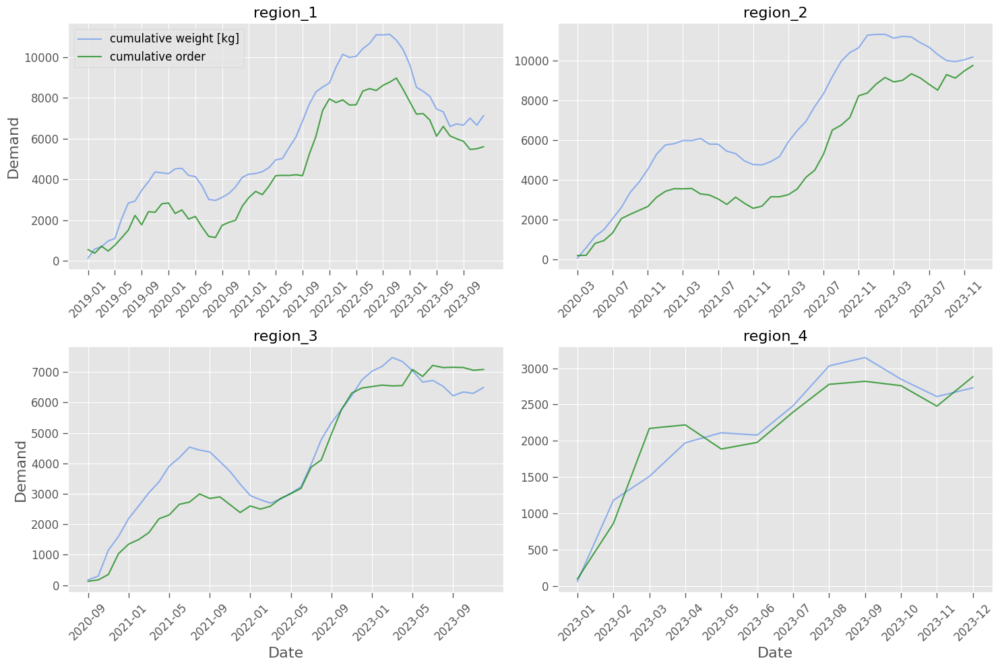

In [40]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

for i, (key, value) in enumerate(regions.items()):
    sns.lineplot(data=value, x='deliver_year_month', y='cumulative_weight', label = 'cumulative weight [kg]', color='cornflowerblue', alpha=0.7, ax=axes[i])
    sns.lineplot(data=value, x='deliver_year_month', y='order_count', label = 'cumulative order', color='green', alpha=0.7, ax=axes[i])
    
    x_label = "Date" if i == 2 or i == 3 else ''
    y_label = "Demand" if i == 0 or i == 2 else ''

    axes[i].set_xlabel(x_label, fontsize=16 if x_label else None)
    axes[i].set_ylabel(y_label, fontsize=16 if y_label else None)
    
    axes[i].set_title(key, fontsize=16)
    axes[i].tick_params(axis='both', which='major', labelsize=12, length=6, width=1)
    axes[i].tick_params(axis='x', rotation=45)
    
    axes[i].legend(fontsize=12 if i == 0 else None).remove() if i != 0 else axes[i].legend(fontsize=12)
    
    if i == 3:
        axes[i].set_xticks(value['deliver_year_month'])
    else:
        axes[i].set_xticks(value['deliver_year_month'][::4])

plt.tight_layout()

**Figure 1:** Time series plots showing cumulative weight (blue) and order count (green) for each region. Region 1 exhibits a moderate demand trend for the first two years, with a steady increase thereafter. Regions 2 and 3 show consistent growth from the beginning. Although Region 4 also experiences an increase in demand, it is less steady compared to Regions 2 and 3.

### Scatter plot of cumulative order for each region 

From now on, we will use cumulative order as primary KPI.

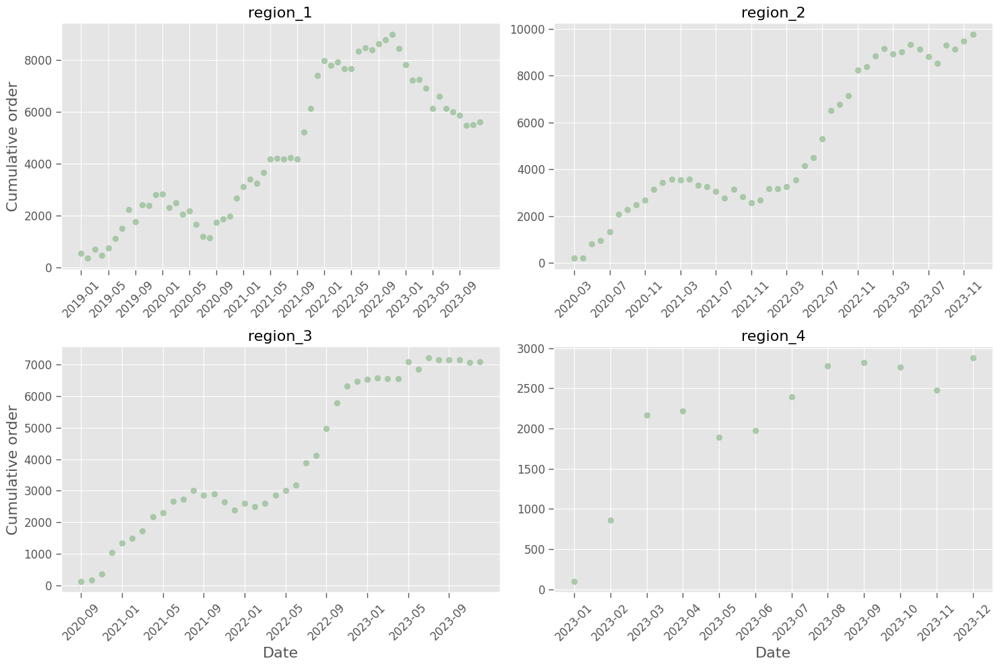

In [41]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

for i, (key, value) in enumerate(regions.items()):
    axes[i].scatter(x=value["deliver_year_month"], y=value["order_count"], color='darkseagreen', alpha=0.7)
    
    x_label = "Date" if i == 2 or i == 3 else ''
    y_label = "Cumulative order" if i == 0 or i == 2 else ''

    axes[i].set_xlabel(x_label, fontsize=16 if x_label else None)
    axes[i].set_ylabel(y_label, fontsize=16 if y_label else None)
    
    axes[i].set_title(key, fontsize=16)
    axes[i].tick_params(axis='both', which='major', labelsize=12, length=6, width=1)
    axes[i].tick_params(axis='x', rotation=45)
        
    if i == 3:
        axes[i].set_xticks(value['deliver_year_month'])
    else:
        axes[i].set_xticks(value['deliver_year_month'][::4])

plt.tight_layout()

**Figure 2:** Scatter plots of the monthly number of orders for each region, illustraing the significant increase in orders in 2020 in Region 1, upward trend for Regions 2, 3, and 4.

## Fitting a Bayesian hierarchical model

### Prepare data

In [42]:
# turning back monthly_demand_regions into a dataframe
combined_df = pd.concat(regions.values(), keys=regions.keys(), names=['region'])
monthly_demand_regions = combined_df.reset_index(level='region')

In [43]:
# Convert the 'deliver_year_month' column to back to datetime
monthly_demand_regions['deliver_year_month'] = pd.to_datetime(monthly_demand_regions['deliver_year_month'])

# Define the cutoff date -> only region 1 contains data before March of 2020, and that data seems to exhibit
# different trend and seasonality than the rest of time series
cutoff_date = pd.to_datetime('2020-03-01')

# Drop rows where 'deliver_year_month' is greater than the cutoff date
monthly_demand_regions = monthly_demand_regions[monthly_demand_regions['deliver_year_month'] >= cutoff_date]

In [44]:
# Sort the DataFrame by 'region' and 'deliver_year_month'and extract the first date for each region
monthly_demand_regions = monthly_demand_regions.sort_values(by=['region', 'deliver_year_month'])

first_dates = monthly_demand_regions.groupby('region')['deliver_year_month'].first().reset_index()
first_dates.rename(columns={'deliver_year_month': 'first_date'}, inplace=True)  # Rename the column to 'first_date'

monthly_demand_regions = monthly_demand_regions.merge(first_dates, on='region', how='left')

In [45]:
# compute the total time since beginning of time-serials (in years)
# This will be later used to calculate seasonality and trend
monthly_demand_regions["time_passed_total"] = (
    monthly_demand_regions['deliver_year_month'].apply(datetime.datetime.toordinal)
    -monthly_demand_regions['first_date'].apply(datetime.datetime.toordinal)
)/365.0

In [46]:
regions_id_dict = {"region_1": 0, "region_2": 1, "region_3": 2, "region_4": 3}
monthly_demand_regions["region_id"] = monthly_demand_regions["region"].apply(regions_id_dict.get) 
monthly_demand_regions

,region,region_id,deliver_year_month,cumulative_weight,order_count,first_date,time_passed_total
0,region_1,0,2020-03-01,4540.507147,2497.391074,2020-03-01,0.000000
1,region_1,0,2020-04-01,4191.891163,2045.935077,2020-03-01,0.084932
2,region_1,0,2020-05-01,4133.804820,2178.198790,2020-03-01,0.167123
3,region_1,0,2020-06-01,3678.598938,1660.482004,2020-03-01,0.252055
4,region_1,0,2020-07-01,3012.893768,1195.071515,2020-03-01,0.334247
...,...,...,...,...,...,...,...
139,region_4,3,2023-08-01,3032.345614,2778.032001,2023-01-01,0.580822
140,region_4,3,2023-09-01,3147.242488,2819.569476,2023-01-01,0.665753
141,region_4,3,2023-10-01,2848.600576,2759.953708,2023-01-01,0.747945
142,region_4,3,2023-11-01,2609.467538,2477.303923,2023-01-01,0.832877


### Bayesian hierarchical models

__[Bayesian hierarchical models](https://en.wikipedia.org/wiki/Bayesian_hierarchical_modeling)__ are a class of statistical models that involve multiple levels of parameters, allowing for the modeling of complex, structured data. They are particularly useful when data is organized in groups or layers, such as nested or repeated measurements, or when modeling different regions that share common characteristics. In these models, parameters at one level of the hierarchy depend on parameters at a higher level, facilitating the sharing of information across different groups. In our case, this means capturing similar seasonality patterns or trends across four regions. This approach leads to more accurate and robust inferences, especially when some groups, like Region 4, have limited data.

#### Model Assumptions and Overview
In this analysis, I make the following key assumptions about the data and the model:

1. **Distribution of Monthly Order Count (or Demand):**
I assume that the monthly order count follows a __[Negative Binomial distribution](https://en.wikipedia.org/wiki/Negative_binomial_distribution)__. This is appropriate because data represents nonnegative count values, and the Negative Binomial distribution is well-suited for modeling count data with overdispersion (i.e., when the variance exceeds the mean).

2. **Parameterization of the Negative Binomial Distribution:**
The Negative Binomial distribution can be parametrized using an overdispersion parameter, α. This parameter is directly related to the variance of the distribution and allows us to model the extra variability observed in the data.

3. **Data Characteristics:**
Our dataset is limited in size. Although each region has its own unique characteristics, there are commonalities between regions that we can use for modeling.

4. **Bayesian Hierarchical Models:**

* **Combining Data:** Bayesian hierarchical models are used to combine data from different regions. This approach allows us to capture both shared patterns and individual variations among regions.

* **Group-Specific Variations:** The hierarchical structure of the model enables us to account for group-specific variations while still pooling information across regions.

5. **Expected Value Components:**
The expected value of the monthly demand is modeled as a product of seasonality and trend:
* **Seasonality:** We assume that the seasonal patterns are similar across regions (e.g., peaks occurring in summer). Therefore, the Bayesian hierarchical model will learn common seasonal parameters for all regions.
* **Trend:** We expect the trend to differ among regions. Thus, the model will estimate distinct trend parameters for each region. In this case, the trend is modeled as a second-order polynomial to capture more complex trends over time.

#### Markov Chain Monte Carlo sampling

__[Markov Chain Monte Carlo (MCMC)](https://en.wikipedia.org/wiki/Markov_chain_Monte_Carlo)__ sampling is a set of algorithms used to approximate the posterior distribution of a model's parameters when direct computation is intractable, which is often the case with Bayesian hierarchical models. MCMC generates samples from this distribution, which can then be used to estimate summary statistics or make predictions.

### Model 1: No hierarchy

In [47]:
with pm.Model() as model_no_hierarchy:
        
        alpha = pm.HalfCauchy("alpha", beta=2) #overdispersion parameter
        
        sine_function = pm.math.sin(2 * np.pi * (monthly_demand_regions["time_passed_total"] % 1))
        cosine_function = pm.math.cos(2 * np.pi * (monthly_demand_regions["time_passed_total"] % 1))

        w_s = pm.Uniform("w_s", -1, 1) # sine parameter for seasonality
        w_c = pm.Uniform("w_c", -1, 1) # cosine parameter for seasonality
        
        seasonality = 1 + sine_function*w_s + cosine_function*w_c
        
        a = pm.Cauchy("a", alpha = 0, beta=2) # trend parameter
        b = pm.Cauchy("b", alpha = 0, beta=2) # trend parameter
        c = pm.Cauchy("c", alpha = 0, beta=2) # trend parameter

        print(a.shape)
        
        trend = pm.math.exp(
            a*monthly_demand_regions["time_passed_total"]**2 + 
            b*monthly_demand_regions["time_passed_total"] +
            c)
                
        mu = seasonality*trend # expected value

        Y = pm.NegativeBinomial("Y", observed=monthly_demand_regions["order_count"], alpha = alpha, mu = mu)
        
        trace_no_hierarchy = pm.sample(draws=2000, tune=1000, chains=4, cores=4, return_inferencedata=True)

        # Compute log likelihood explicitly
        pm.compute_log_likelihood(trace_no_hierarchy, extend_inferencedata=True)

        

Shape.0


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, w_s, w_c, a, b, c]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.


Output()

In [48]:
model_no_hierarchy

alpha ~ HalfCauchy(0, 2)
  w_s ~ Uniform(-1, 1)
  w_c ~ Uniform(-1, 1)
    a ~ Cauchy(0, 2)
    b ~ Cauchy(0, 2)
    c ~ Cauchy(0, 2)
    Y ~ NegativeBinomial(alpha, f(alpha, c, w_c, w_s, b, a))

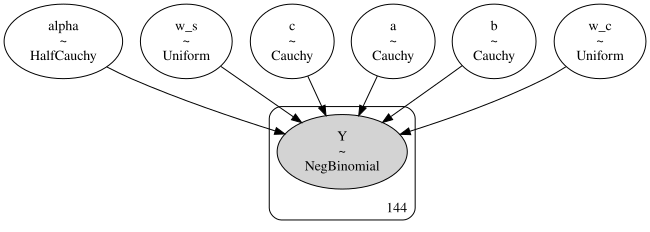

In [49]:
pm.model_to_graphviz(model_no_hierarchy)

### Model 2: Region-hierarchy

In [50]:
with pm.Model() as model_hierarchy:
        
        alpha = pm.HalfCauchy("alpha", beta=2) #overdispersion parameter
        
        sine_function = pm.math.sin(2 * np.pi * (monthly_demand_regions["time_passed_total"] % 1))
        cosine_function = pm.math.cos(2 * np.pi * (monthly_demand_regions["time_passed_total"] % 1))

        w_s = pm.Uniform("w_s", -1, 1) # sine parameter for seasonality
        w_c = pm.Uniform("w_c", -1, 1) # cosine parameter for seasonality
        
        seasonality = 1 + sine_function*w_s + cosine_function*w_c
        
        a = pm.Cauchy("a", alpha = 0, beta=2, shape=(4,)) # trend parameter
        b = pm.Cauchy("b", alpha = 0, beta=2, shape=(4,)) # trend parameter
        c = pm.Cauchy("c", alpha = 0, beta=2, shape=(4,)) # trend parameter
        
        trend = pm.math.exp(
            a[monthly_demand_regions["region_id"]]*monthly_demand_regions["time_passed_total"]**2 + 
            b[monthly_demand_regions["region_id"]]*monthly_demand_regions["time_passed_total"] +
            c[monthly_demand_regions["region_id"]])
                
        mu = seasonality*trend # expected value

        Y = pm.NegativeBinomial("Y", observed=monthly_demand_regions["order_count"], alpha = alpha, mu = mu)
        
        trace_hierarchy = pm.sample(draws=2000, tune=1000, chains=4, cores=4, return_inferencedata=True)

        # Compute log likelihood explicitly
        pm.compute_log_likelihood(trace_hierarchy, extend_inferencedata=True)

        

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alpha, w_s, w_c, a, b, c]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 9 seconds.


Output()

In [51]:
model_hierarchy

alpha ~ HalfCauchy(0, 2)
  w_s ~ Uniform(-1, 1)
  w_c ~ Uniform(-1, 1)
    a ~ Cauchy(0, 2)
    b ~ Cauchy(0, 2)
    c ~ Cauchy(0, 2)
    Y ~ NegativeBinomial(alpha, f(alpha, c, w_c, w_s, b, a))

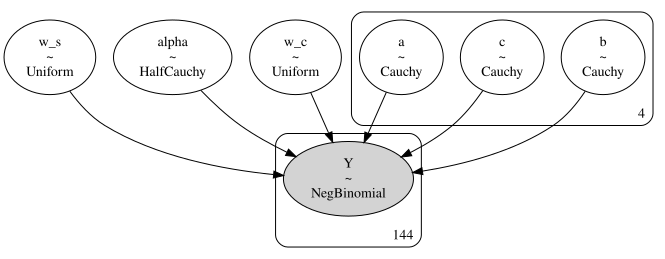

In [52]:
model_hierarchy.to_graphviz()

In [100]:
pm.summary(trace_hierarchy)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a[0],-0.238,0.044,-0.318,-0.153,0.001,0.000,5947.0,5615.0,1.0
a[1],-0.129,0.054,-0.227,-0.023,0.001,0.001,5937.0,5013.0,1.0
a[2],-0.286,0.075,-0.421,-0.145,0.001,0.001,5346.0,5416.0,1.0
a[3],-3.207,1.780,-6.412,0.081,0.025,0.018,5033.0,5220.0,1.0
b[0],1.281,0.168,0.971,1.601,0.002,0.002,5610.0,5184.0,1.0
b[1],1.100,0.214,0.699,1.504,0.003,0.003,5776.0,4803.0,1.0
b[2],1.682,0.256,1.225,2.162,0.004,0.003,5174.0,5179.0,1.0
b[3],4.402,1.792,1.178,7.737,0.026,0.019,4929.0,4854.0,1.0
c[0],7.207,0.138,6.952,7.472,0.002,0.001,6507.0,6245.0,1.0
c[1],6.856,0.171,6.524,7.165,0.002,0.002,6102.0,5243.0,1.0


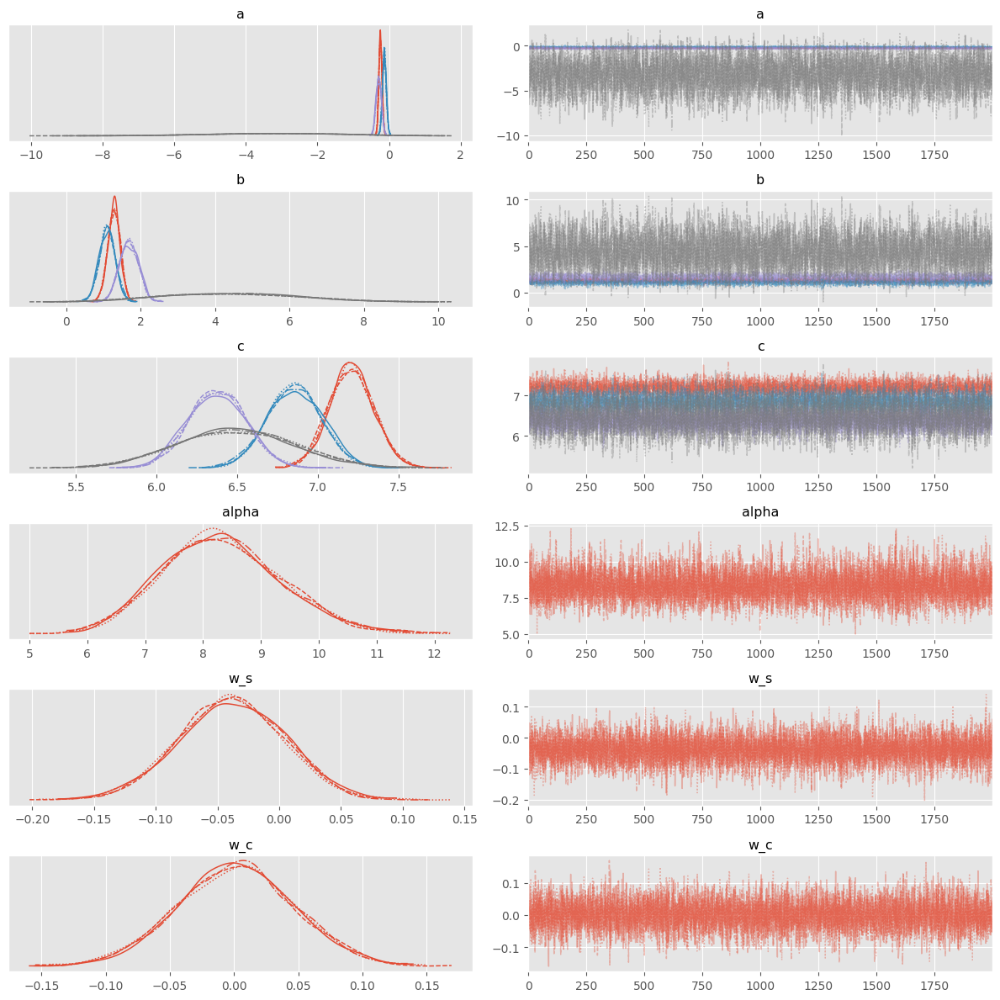

In [101]:
az.plot_trace(trace_hierarchy, compact=True)

plt.tight_layout()

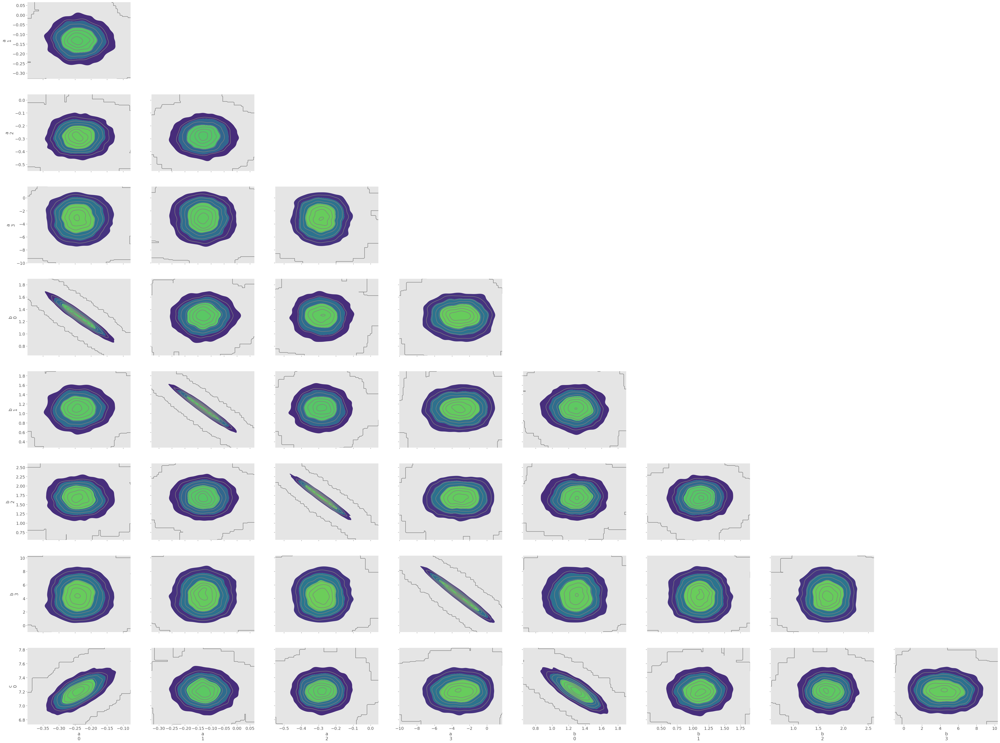

In [110]:
az.plot_pair(trace_hierarchy,
             divergences=True,
            kind='kde')
plt.show()

/opt/anaconda3/envs/predict-demand/lib/python3.11/site-packages/arviz/plots/backends/matplotlib/pairplot.py:233: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


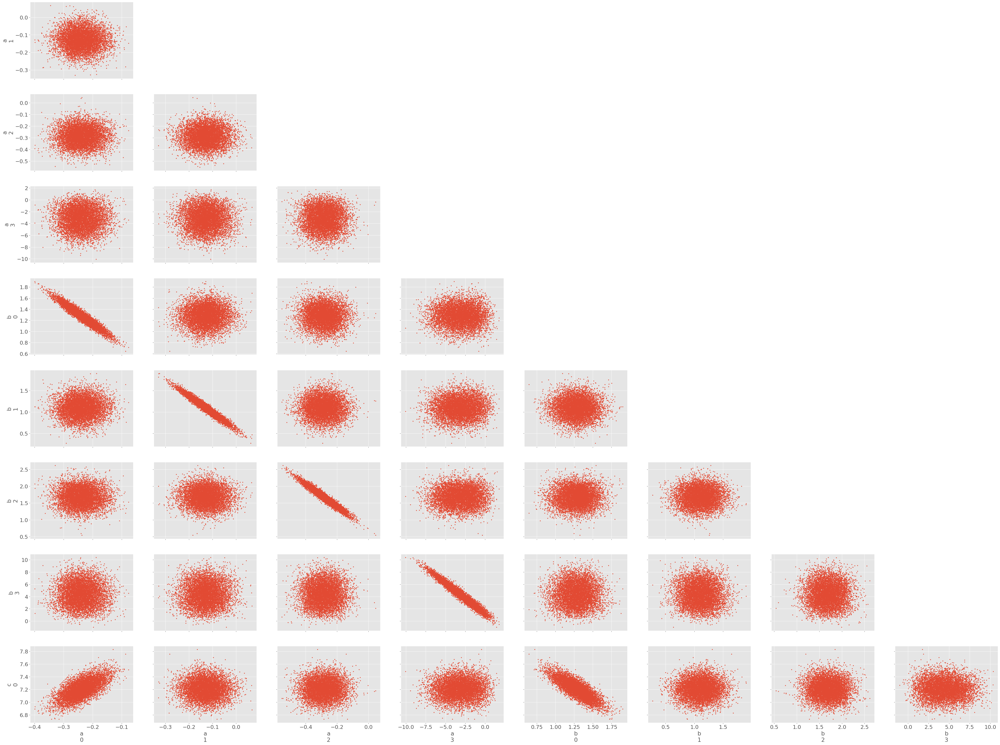

In [112]:
az.plot_pair(trace_hierarchy,
             divergences=True,
            kind='scatter')
plt.show()

## Model 3: Additional (California) hierarchy

In [85]:
with pm.Model() as model_with_additional_hierarchy:

    # -------- California-level hyperparameters (for regions 1 and 2) --------
    a_california = pm.Normal("a_california", mu=0, sigma=2)
    sigma_a_cal = pm.HalfNormal("sigma_a_cal", sigma=1)

    b_california = pm.Normal("b_california", mu=0, sigma=2)
    sigma_b_cal = pm.HalfNormal("sigma_b_cal", sigma=1)

    c_california = pm.Normal("c_california", mu=0, sigma=2)
    sigma_c_cal = pm.HalfNormal("sigma_c_cal", sigma=1)

    # -------- Non-centered offsets for California regions --------
    a_region_1_offset = pm.Normal("a_region_1_offset", mu=0, sigma=1)
    a_region_2_offset = pm.Normal("a_region_2_offset", mu=0, sigma=1)

    b_region_1_offset = pm.Normal("b_region_1_offset", mu=0, sigma=1)
    b_region_2_offset = pm.Normal("b_region_2_offset", mu=0, sigma=1)

    c_region_1_offset = pm.Normal("c_region_1_offset", mu=0, sigma=1)
    c_region_2_offset = pm.Normal("c_region_2_offset", mu=0, sigma=1)

    # Calculate hierarchical region parameters for California
    a_region_1 = pm.Deterministic("a_region_1", a_california + a_region_1_offset * sigma_a_cal)
    a_region_2 = pm.Deterministic("a_region_2", a_california + a_region_2_offset * sigma_a_cal)

    b_region_1 = pm.Deterministic("b_region_1", b_california + b_region_1_offset * sigma_b_cal)
    b_region_2 = pm.Deterministic("b_region_2", b_california + b_region_2_offset * sigma_b_cal)

    c_region_1 = pm.Deterministic("c_region_1", c_california + c_region_1_offset * sigma_c_cal)
    c_region_2 = pm.Deterministic("c_region_2", c_california + c_region_2_offset * sigma_c_cal)

    # -------- Independent parameters for non-California regions 3 and 4 --------
    a_region_3 = pm.Normal("a_region_3", mu=0, sigma=2)
    a_region_4 = pm.Normal("a_region_4", mu=0, sigma=2)

    b_region_3 = pm.Normal("b_region_3", mu=0, sigma=2)
    b_region_4 = pm.Normal("b_region_4", mu=0, sigma=2)

    c_region_3 = pm.Normal("c_region_3", mu=0, sigma=2)
    c_region_4 = pm.Normal("c_region_4", mu=0, sigma=2)

    # -------- Get region IDs for each observation (assumed as integer numpy array) --------
    region_id = monthly_demand_regions["region_id"]

    # -------- Select 'a' parameter per region using nested pm.math.switch --------
    a = pm.math.switch(region_id == 1, a_region_1,
        pm.math.switch(region_id == 2, a_region_2,
            pm.math.switch(region_id == 3, a_region_3,
                a_region_4
            )
        )
    )

    b = pm.math.switch(region_id == 1, b_region_1,
        pm.math.switch(region_id == 2, b_region_2,
            pm.math.switch(region_id == 3, b_region_3,
                b_region_4
            )
        )
    )

    c = pm.math.switch(region_id == 1, c_region_1,
        pm.math.switch(region_id == 2, c_region_2,
            pm.math.switch(region_id == 3, c_region_3,
                c_region_4
            )
        )
    )

    # -------- Seasonality parameters --------
    w_s = pm.Uniform("w_s", -1, 1)
    w_c = pm.Uniform("w_c", -1, 1)
    alpha = pm.HalfCauchy("alpha", beta=2)

    sine_function = pm.math.sin(2 * np.pi * (monthly_demand_regions["time_passed_total"] % 1))
    cosine_function = pm.math.cos(2 * np.pi * (monthly_demand_regions["time_passed_total"] % 1))
    seasonality = 1 + sine_function * w_s + cosine_function * w_c

    # -------- Trend calculation --------
    trend = pm.math.exp(
        a * monthly_demand_regions["time_passed_total"]**2 +
        b * monthly_demand_regions["time_passed_total"] +
        c
    )

    mu = seasonality * trend

    # -------- Observed data likelihood --------
    Y = pm.NegativeBinomial("Y", mu=mu, alpha=alpha, observed=monthly_demand_regions["order_count"])

    # Sample from the posterior
    trace_with_additional_hierarchy = pm.sample(
        draws=2000,
        tune=1000,
        chains=4,
        cores=4,
        return_inferencedata=True
    )

    # Compute log likelihood for model comparison etc.
    pm.compute_log_likelihood(trace_with_additional_hierarchy, extend_inferencedata=True)


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a_california, sigma_a_cal, b_california, sigma_b_cal, c_california, sigma_c_cal, a_region_1_offset, a_region_2_offset, b_region_1_offset, b_region_2_offset, c_region_1_offset, c_region_2_offset, a_region_3, a_region_4, b_region_3, b_region_4, c_region_3, c_region_4, w_s, w_c, alpha]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 58 seconds.
There were 780 divergences after tuning. Increase `target_accept` or reparameterize.


Output()

This doesn't look good! There are many divergences in out model.

Divergences mean that the sampler is having trouble exploring the posterior distribution properly. They often happen when the model’s geometry is complex, such as with strong correlations or funnel-shaped posteriors. 

This means parts of the parameter space are poorly explored, which leads to biased or unreliable estimates. Fixing them usually requires reparameterizing (like using non-centered parametrizations), adjusting priors, or increasing sampling effort. Ignoring divergences risks drawing wrong conclusions from the analysis.

In [86]:
model_with_additional_hierarchy

     a_california ~ Normal(0, 2)
      sigma_a_cal ~ HalfNormal(0, 1)
     b_california ~ Normal(0, 2)
      sigma_b_cal ~ HalfNormal(0, 1)
     c_california ~ Normal(0, 2)
      sigma_c_cal ~ HalfNormal(0, 1)
a_region_1_offset ~ Normal(0, 1)
a_region_2_offset ~ Normal(0, 1)
b_region_1_offset ~ Normal(0, 1)
b_region_2_offset ~ Normal(0, 1)
c_region_1_offset ~ Normal(0, 1)
c_region_2_offset ~ Normal(0, 1)
       a_region_3 ~ Normal(0, 2)
       a_region_4 ~ Normal(0, 2)
       b_region_3 ~ Normal(0, 2)
       b_region_4 ~ Normal(0, 2)
       c_region_3 ~ Normal(0, 2)
       c_region_4 ~ Normal(0, 2)
              w_s ~ Uniform(-1, 1)
              w_c ~ Uniform(-1, 1)
            alpha ~ HalfCauchy(0, 2)
       a_region_1 ~ Deterministic(f(a_california, sigma_a_cal, a_region_1_offset))
       a_region_2 ~ Deterministic(f(a_california, sigma_a_cal, a_region_2_offset))
       b_region_1 ~ Deterministic(f(b_california, sigma_b_cal, b_region_1_offset))
       b_region_2 ~ Deterministic(f(b_

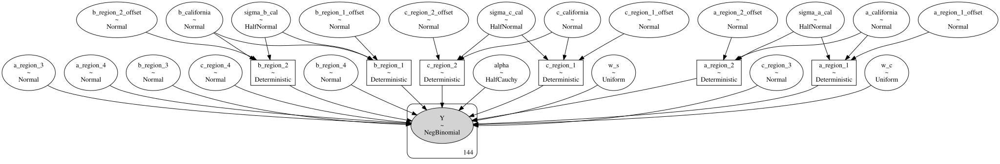

In [83]:
pm.model_to_graphviz(model_with_additional_hierarchy)

In [102]:
pm.summary(trace_with_additional_hierarchy)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
a_california,-0.200,0.142,-0.504,0.088,0.004,0.004,1380.0,1175.0,1.01
b_california,1.325,0.402,0.507,2.152,0.013,0.018,1322.0,687.0,1.00
c_california,6.163,0.723,4.556,7.166,0.021,0.021,1533.0,1415.0,1.01
a_region_1_offset,0.208,0.742,-1.181,1.710,0.016,0.012,2210.0,2479.0,1.00
a_region_2_offset,-0.232,0.740,-1.615,1.202,0.016,0.010,2087.0,3323.0,1.00
b_region_1_offset,-0.197,0.820,-1.840,1.303,0.017,0.013,2260.0,1307.0,1.00
b_region_2_offset,0.350,0.806,-1.140,1.895,0.016,0.012,2415.0,2588.0,1.00
c_region_1_offset,0.697,0.757,-0.793,2.068,0.015,0.012,2663.0,3470.0,1.00
c_region_2_offset,0.159,0.842,-1.413,1.618,0.019,0.011,1891.0,3272.0,1.00
a_region_3,-2.073,1.119,-4.224,0.052,0.024,0.017,2112.0,2484.0,1.00


Although `r_hat` looks good, we know we got divergences during sampling. Let's examine them.

/opt/anaconda3/envs/predict-demand/lib/python3.11/site-packages/arviz/plots/traceplot.py:223: UserWarning: rcParams['plot.max_subplots'] (20) is smaller than the number of variables to plot (27), generating only 20 plots
  warnings.warn(


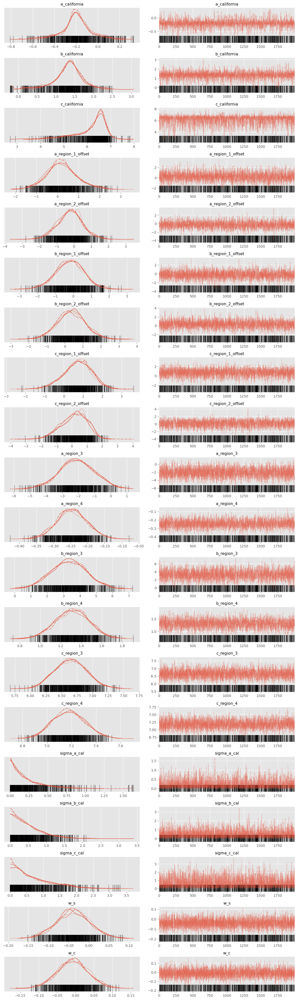

In [103]:
az.plot_trace(trace_with_additional_hierarchy, compact=True)

plt.tight_layout()

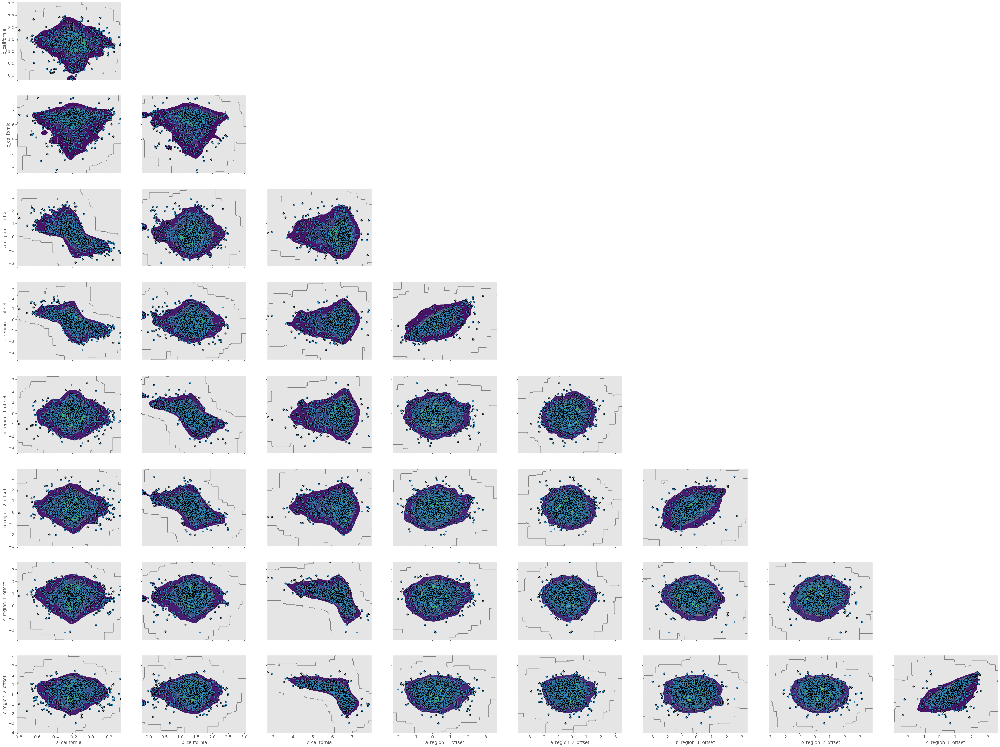

In [109]:
az.plot_pair(trace_with_additional_hierarchy,
             divergences=True,
            kind='kde')
plt.show()

# Model comparison

In [96]:
compare_df = az.compare({"model_hierarchy": trace_hierarchy, 
                   "model_no_hierarchy": trace_no_hierarchy, 
                   "model_with_additional_hierarchy": trace_with_additional_hierarchy}, 
           ic='loo', method = 'stacking')

display(compare_df)

/opt/anaconda3/envs/predict-demand/lib/python3.11/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/opt/anaconda3/envs/predict-demand/lib/python3.11/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
model_with_additional_hierarchy,0,-1244.675949,18.792714,0.000000,0.451767,11.939708,0.000000,True,log
model_hierarchy,1,-1245.138054,21.570192,0.462106,0.474556,12.126113,2.111739,True,log
model_no_hierarchy,2,-1255.425635,8.123934,10.749687,0.073678,11.777697,4.535335,False,log


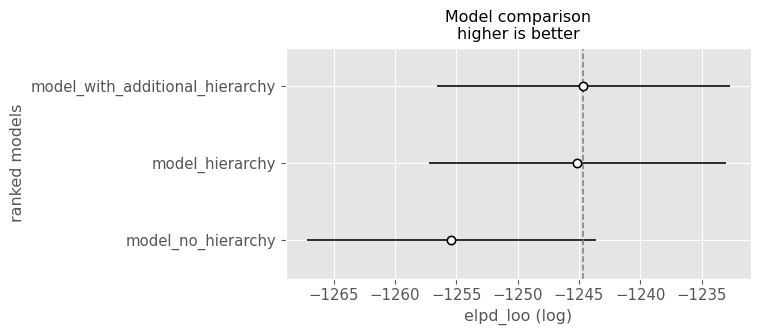

In [98]:
az.plot_compare(compare_df)
plt.show()

The model with the additional hierarchy ranks highest in `arviz.compare()` based on LOO predictive accuracy, but it also shows divergences during sampling. 
Divergences indicate issues with the geometry of the posterior that can cause biased parameter estimates or poor exploration by the sampler. `arviz.compare()` evaluates models purely on *predictive metrics* and doesn’t account for sampling diagnostics like divergences. 

So, the complex hierarchical model fits the data better from a predictive standpoint, but the sampler struggles with its posterior. This trade-off means the improved predictive score doesn’t guarantee reliable inference. 

Addressing divergences—through reparameterization or tuning is necessary to trust the results despite better predictive performance.

### Exploration of khat values

`k̂` (`k_hat`) values (Pareto shape parameters) are used to assess how reliable the approximate leave-one-out cross-validation (LOO-CV) estimate is.

Values below 0.5 are safe, 0.5–0.7 suggest some fragility, and anything above 0.7 means LOO might not be reliable for those observations. 

High `k̂` show cases where the model is struggling, for example because a single point has a disproportionate influence on the posterior. But that doesn’t always mean the point is an outlier in the data. This it just means the model has trouble fitting that part of the space.

More on this you can find here: https://jmlr.org/papers/v25/19-556.html

/opt/anaconda3/envs/predict-demand/lib/python3.11/site-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


<Axes: xlabel='Data Point', ylabel='Shape parameter k'>

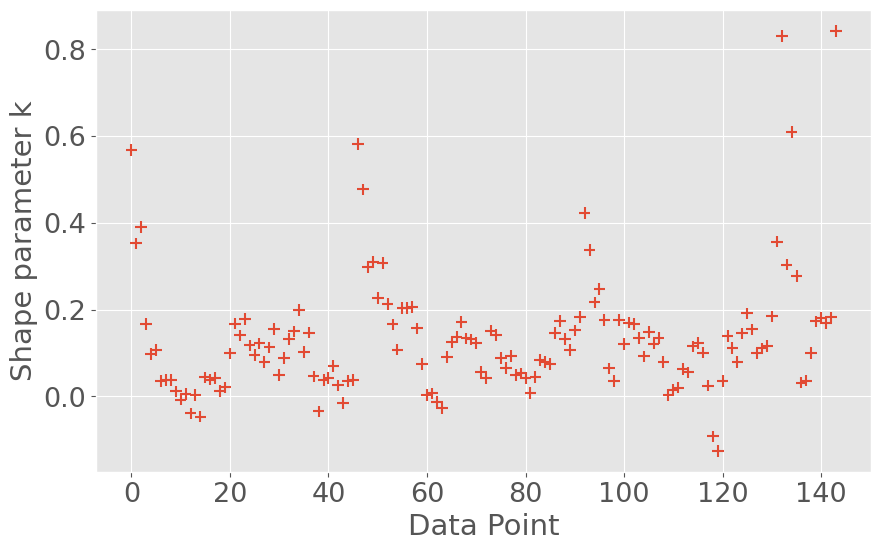

In [113]:
loo_result = az.loo(trace_hierarchy, pointwise=True)
az.plot_khat(loo_result, figsize=(10, 6))

In [114]:
# Extract Pareto k values
pareto_k = loo_result.pareto_k.values

# Find problematic observations
problematic_indices = np.where(pareto_k > 0.7)[0]
print(f"Problematic observations (Pareto k > 0.7): {problematic_indices}")

Problematic observations (Pareto k > 0.7): [132 143]


In [115]:
monthly_demand_regions.iloc[132]

region                           region_4
region_id                               3
deliver_year_month    2023-01-01 00:00:00
cumulative_weight               65.357501
order_count                         100.0
first_date            2023-01-01 00:00:00
time_passed_total                     0.0
Name: 132, dtype: object

### Generating predictions based on posterior distribution of the hierarchical model

Since the "simpler" hierarchial model seems to work the best, we will generate predictions only using that model.

In [116]:
posterior_predictive = pm.sample_posterior_predictive(trace_hierarchy, model=model_hierarchy)

# Extract posterior predictive samples
ppc_samples = posterior_predictive.posterior_predictive['Y'].values

Sampling: [Y]


Output()

### Posterior Predictive Check

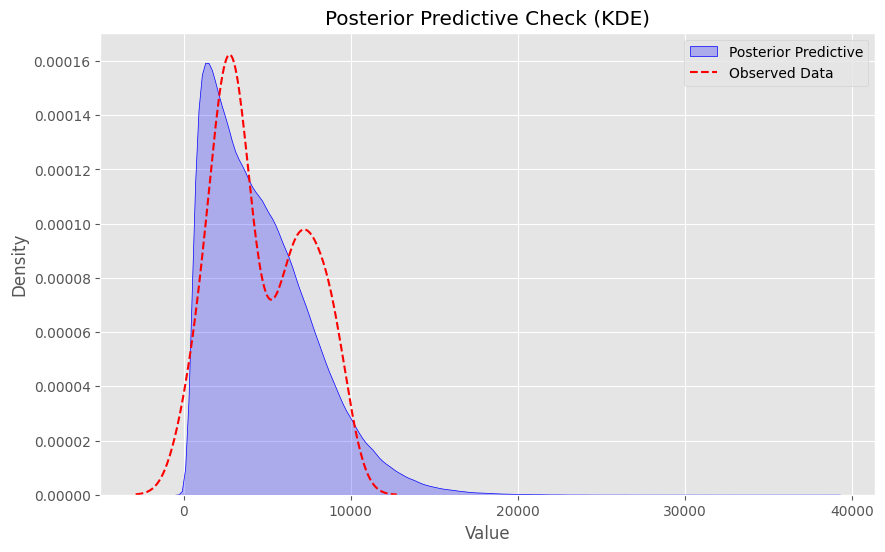

In [117]:
plt.figure(figsize=(10, 6))
sns.kdeplot(ppc_samples.flatten(), label='Posterior Predictive', color='blue', fill=True)
sns.kdeplot(monthly_demand_regions["order_count"], label='Observed Data', color='red', linestyle='--')
plt.xlabel('Value')
plt.ylabel('Density')
plt.title('Posterior Predictive Check (KDE)')
plt.legend()
plt.show()

### Compute predictions

In [118]:
predicted_means = np.mean(np.mean(ppc_samples, axis=0), axis=0) #average over chains and samples
monthly_demand_regions["predicted_means"] = predicted_means

lower_bound = np.percentile(np.mean(ppc_samples, axis=0), 2.5, axis=0)  # 2.5th percentile
upper_bound = np.percentile(np.mean(ppc_samples, axis=0), 97.5, axis=0)  # 97.5th percentile

monthly_demand_regions["lower_bound"] = lower_bound
monthly_demand_regions["upper_bound"] = upper_bound

### Calculate r2

In [119]:
r2_scores = {}

for region_id in monthly_demand_regions['region_id'].unique():
    group = monthly_demand_regions[monthly_demand_regions['region_id'] == region_id]
    y_obs = group['order_count'].values
    y_pred = group['predicted_means'].values
    region_name = group['region'].iloc[0]
    r2_scores[region_name] = r2_score(y_obs, y_pred)

for region_name, r2 in r2_scores.items():
    print(f'R-squared for {region_name}: {r2}')

R-squared for region_1: 0.8921561822270757
R-squared for region_2: 0.9003424541335735
R-squared for region_3: 0.9106449750992707
R-squared for region_4: 0.6913233159441048


### Observed vs Predicted plot for each regions

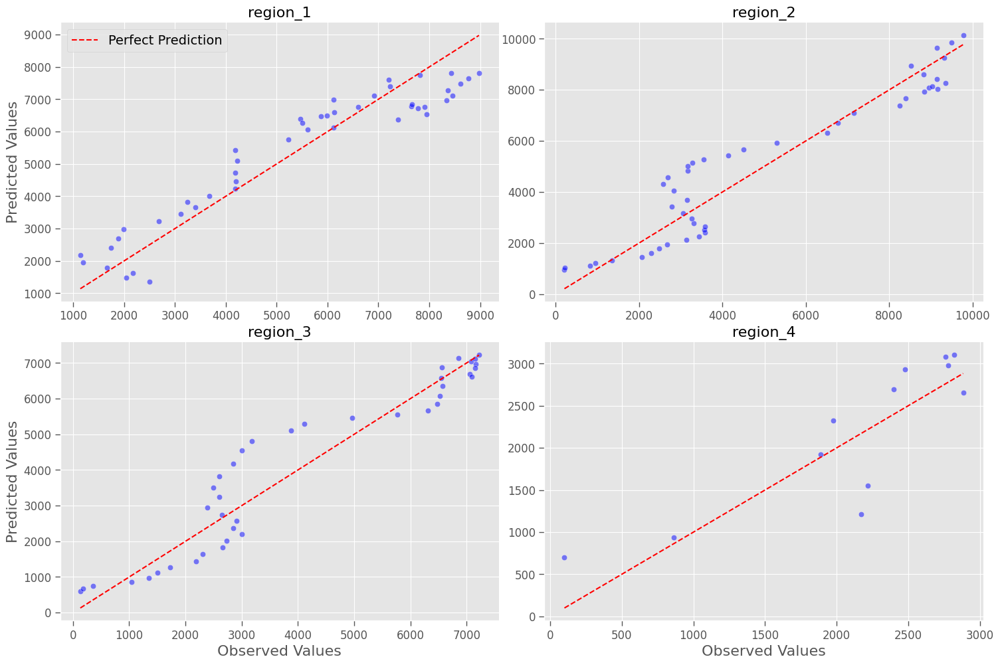

In [120]:
g = sns.FacetGrid(monthly_demand_regions, col='region', col_wrap=2, height=5, aspect=1.5, sharex=False, sharey=False)
g.map(sns.scatterplot, 'order_count', 'predicted_means', alpha=0.5, color='blue')
g.map(sns.lineplot, 'order_count', 'order_count', color='red', linestyle='--', label='Perfect Prediction')

_ = [ax.set_title(title, fontsize=16) for ax, title in zip(g.axes.flat, g.col_names)]

for i, ax in enumerate(g.axes.flat):
    x_label = "Observed Values" if i == 2 or i == 3 else ''
    y_label = "Predicted Values" if i == 0 or i == 2 else ''
    
    ax.set_xlabel(x_label, fontsize=16 if x_label else None)
    ax.set_ylabel(y_label, fontsize=16 if y_label else None)
    
    ax.tick_params(axis='both', which='major', labelsize=12, length=6, width=1)

# Add legend to the first subplot with non-empty legend handles
next((ax.legend(*ax.get_legend_handles_labels(), fontsize=14, loc='upper left', bbox_to_anchor=(0, 1))
      for ax in g.axes.flat if ax.get_legend_handles_labels()[0]), None)

This plot compares the observed data (x-axis) with the predicted values (y-axis) generated by the model for 4 regions. The diagonal red dashed line represents the line of perfect prediction. Points close to this line indicate better predictions (as in Region 1, and some points in Region 2 and 3), while scattered points (as in Region 4, and some point in Region 2 and 3) indicate more significant discrepancies between the model’s predictions and the observed data.

### Predictions for each region

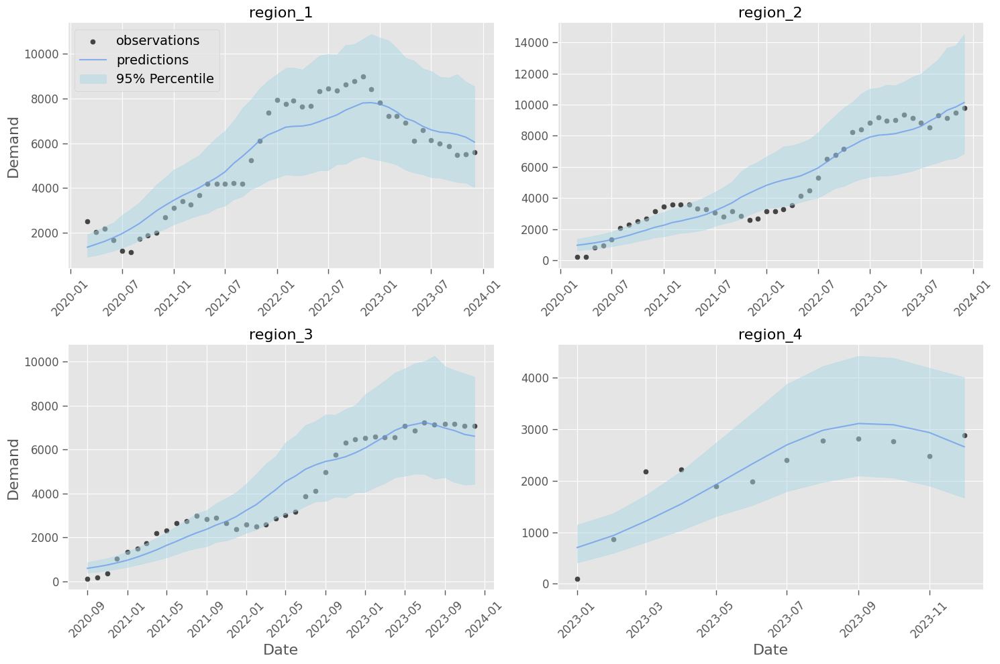

In [121]:
g = sns.FacetGrid(monthly_demand_regions, col='region', col_wrap=2, height=5, aspect=1.5, sharex=False, sharey=False)
g.map(sns.scatterplot, 'deliver_year_month', 'order_count', label = 'observations', color='black', alpha=0.7)
g.map(sns.lineplot, 'deliver_year_month', 'predicted_means', label='predictions', color='cornflowerblue', alpha=0.7)

fill_patch = patches.Patch(color='lightblue', alpha=0.5, label='95% Percentile')
for ax, (region, subset) in zip(g.axes.flat, monthly_demand_regions.groupby('region')):
    ax.fill_between(subset['deliver_year_month'], 
                    subset['lower_bound'],
                    subset['upper_bound'], 
                    color='lightblue', alpha=0.5)

_ = [ax.set_title(title, fontsize=16) for ax, title in zip(g.axes.flat, g.col_names)]

for i, ax in enumerate(g.axes.flat):
    x_label = "Date" if i == 2 or i == 3 else ''
    y_label = "Demand" if i == 0 or i == 2 else ''
    
    ax.set_xlabel(x_label, fontsize=16 if x_label else None)
    ax.set_ylabel(y_label, fontsize=16 if y_label else None)
    
    ax.tick_params(axis='both', which='major', labelsize=12, length=6, width=1)
    ax.tick_params(axis='x', rotation=45)
    
first_ax = g.axes.flat[0]  # Access the first subplot
handles, labels = first_ax.get_legend_handles_labels()
handles.append(fill_patch)  # Add the fill color patch
labels.append('95% Percentile')  # Add label for the fill color
first_ax.legend(handles, labels, fontsize=14, loc='upper left', bbox_to_anchor=(0, 1))
    
plt.tight_layout()

Observed data (black dots) and predictions (blue lines) are shown for four regions. The shaded areas represent the 5%-95% percentiles of the predictions, indicating the uncertainty range. The model fits Region 1 the best. For Regions 2 and 3, overestimation of data points tends to occur as the effects of seasonality decrease. The model also performs well for Region 4. Although it occasionally overestimates data points, the discrepancies are relatively minor.

## Make predictions for unseen data points

### Prepare unseen data

We will only use model that fits best to make predictions on unseen data.

In [89]:
filtered_df = monthly_demand_regions[monthly_demand_regions['region'].isin(["region_1", "region_2", "region_3", "region_4"])]
filtered_df = filtered_df[['region', 'first_date']].drop_duplicates()

In [90]:
dates = ['2024-01-01', '2024-02-01', '2024-03-01']
regions = ['region_1', 'region_2', 'region_3', 'region_4']
region_ids = {'region_1': 0, 'region_2': 1, 'region_3': 2, 'region_4': 3}

unseen_data = pd.DataFrame([
    {'region': region, 'deliver_year_month': date, 
     'first_date': filtered_df.loc[filtered_df['region'] == region, 'first_date'].values[0], 
     'region_id': region_ids[region]}
    for region in regions
    for date in dates
])

unseen_data['deliver_year_month'] = pd.to_datetime(unseen_data['deliver_year_month'])
unseen_data['first_date'] = pd.to_datetime(unseen_data['first_date'])

In [91]:
unseen_data["time_passed_total"] = (
    unseen_data['deliver_year_month'].apply(datetime.datetime.toordinal)
    -unseen_data['first_date'].apply(datetime.datetime.toordinal)
)/365.0

In [92]:
unseen_data

,region,deliver_year_month,first_date,region_id,time_passed_total
0,region_1,2024-01-01,2020-03-01,0,3.838356
1,region_1,2024-02-01,2020-03-01,0,3.923288
2,region_1,2024-03-01,2020-03-01,0,4.002740
3,region_2,2024-01-01,2020-03-01,1,3.838356
4,region_2,2024-02-01,2020-03-01,1,3.923288
5,region_2,2024-03-01,2020-03-01,1,4.002740
6,region_3,2024-01-01,2020-09-01,2,3.334247
7,region_3,2024-02-01,2020-09-01,2,3.419178
8,region_3,2024-03-01,2020-09-01,2,3.498630
9,region_4,2024-01-01,2023-01-01,3,1.000000


### Run a prediction model on unseen data

In [93]:
with pm.Model() as prediction_model:
    alpha = pm.HalfCauchy("alpha", beta=2)

    sine_function = pm.math.sin(2 * np.pi * (unseen_data["time_passed_total"] % 1))
    cosine_function = pm.math.cos(2 * np.pi * (unseen_data["time_passed_total"] % 1))

    w_s = pm.Uniform("w_s", -1, 1)
    w_c = pm.Uniform("w_c", -1, 1)

    seasonality = 1 + sine_function * w_s + cosine_function * w_c

    a = pm.Cauchy("a", alpha=0, beta=2, shape=(4,))
    b = pm.Cauchy("b", alpha=0, beta=2, shape=(4,))
    c = pm.Cauchy("c", alpha=0, beta=2, shape=(4,))

    trend = pm.math.exp(
        a[unseen_data["region_id"]] * unseen_data["time_passed_total"]**2 +
        b[unseen_data["region_id"]] * unseen_data["time_passed_total"] +
        c[unseen_data["region_id"]])

    mu = seasonality * trend

    Y_pred = pm.NegativeBinomial("Y_pred", mu=mu, alpha=alpha)

    posterior_predictive = pm.sample_posterior_predictive(trace_hierarchy, var_names=["Y_pred"]) # trace from the trained model


Sampling: [Y_pred]


Output()

In [94]:
unseen_predictions = posterior_predictive.posterior_predictive["Y_pred"]

# Compute the mean of posterior predictive samples as predictions
unseen_predicted_means = np.mean(np.mean(unseen_predictions, axis=0), axis=0) #average over chains and samples
unseen_data["predicted_means"] = unseen_predicted_means

# compute percentiles
unseen_lower_bound = np.percentile(np.mean(unseen_predictions, axis=0), 2.5, axis=0)  # 2.5th percentile
unseen_upper_bound = np.percentile(np.mean(unseen_predictions, axis=0), 97.5, axis=0)  # 97.5th percentile

unseen_data["lower_bound"] = unseen_lower_bound
unseen_data["upper_bound"] = unseen_upper_bound

### Predictions for region on unseen data


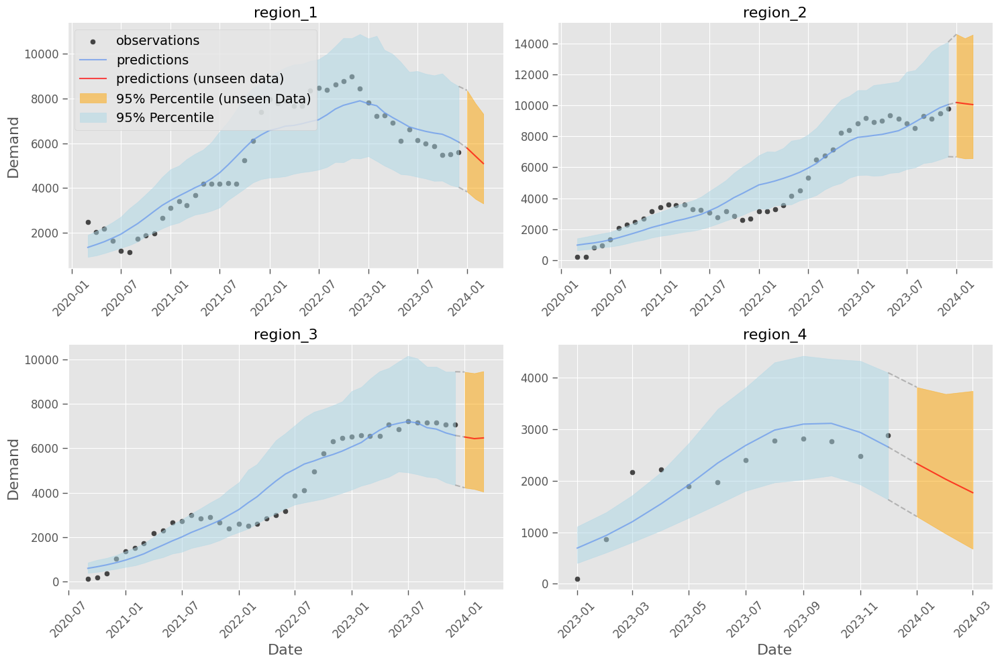

In [44]:
g = sns.FacetGrid(monthly_demand_regions, col='region', col_wrap=2, height=5, aspect=1.5, sharex=False, sharey=False)

# Plot the original data
g.map(sns.scatterplot, 'deliver_year_month', 'order_count', label='observations', color='black', alpha=0.7)
g.map(sns.lineplot, 'deliver_year_month', 'predicted_means', label='predictions', color='cornflowerblue', alpha=0.7)

# Plot predictions and intervals for unseen data
for ax, (region, subset) in zip(g.axes.flat, monthly_demand_regions.groupby('region')):
    pred_subset = unseen_data[unseen_data['region'] == region]
    
    if not subset.empty and not pred_subset.empty:
        last_obs_point = subset.iloc[-1]
        first_unseen_point = pred_subset.iloc[0]

        # Connect the predicted means
        ax.plot([last_obs_point['deliver_year_month'], first_unseen_point['deliver_year_month']],
                [last_obs_point['predicted_means'], first_unseen_point['predicted_means']],
                color='grey', linestyle='--', alpha=0.5)

        # Connect the lower bounds
        ax.plot([last_obs_point['deliver_year_month'], first_unseen_point['deliver_year_month']],
                [last_obs_point['lower_bound'], first_unseen_point['lower_bound']],
                color='grey', linestyle='--', alpha=0.5)

        # Connect the upper bounds
        ax.plot([last_obs_point['deliver_year_month'], first_unseen_point['deliver_year_month']],
                [last_obs_point['upper_bound'], first_unseen_point['upper_bound']],
                color='grey', linestyle='--', alpha=0.5)
    
    ax.plot(pred_subset['deliver_year_month'], pred_subset['predicted_means'], 
            label='predictions (unseen data)', color='red', alpha=0.7)

    ax.fill_between(pred_subset['deliver_year_month'], 
                    pred_subset['lower_bound'],
                    pred_subset['upper_bound'], 
                    color='orange', alpha=0.5, label='95% Percentile (unseen Data)')

for ax, (region, subset) in zip(g.axes.flat, monthly_demand_regions.groupby('region')):
    ax.fill_between(subset['deliver_year_month'], 
                    subset['lower_bound'],
                    subset['upper_bound'], 
                    color='lightblue', alpha=0.5, label='95% Percentile')

_ = [ax.set_title(title, fontsize=16) for ax, title in zip(g.axes.flat, g.col_names)]

for i, ax in enumerate(g.axes.flat):
    x_label = "Date" if i == 2 or i == 3 else ''
    y_label = "Demand" if i == 0 or i == 2 else ''
    
    ax.set_xlabel(x_label, fontsize=16 if x_label else None)
    ax.set_ylabel(y_label, fontsize=16 if y_label else None)
    
    ax.tick_params(axis='both', which='major', labelsize=12, length=6, width=1)
    ax.tick_params(axis='x', rotation=45)
    
first_ax = g.axes.flat[0]
handles, labels = first_ax.get_legend_handles_labels()

fill_patch_blue = patches.Patch(color='lightblue', alpha=0.5, label='95% Percentile')
fill_patch_orange = patches.Patch(color='orange', alpha=0.5, label='95% Percentile (unseen Data)')

handles.append(fill_patch_blue)
handles.append(fill_patch_orange)
first_ax.legend(handles, labels, fontsize=14, loc='upper left', bbox_to_anchor=(0, 1))

plt.tight_layout()

Observed data (black dots), predictions based on observed data (blue lines), and predictions on unseen data (red lines) are shown for four regions. The shaded blue areas represent the 5%-95% percentiles of the predictions on observed data, while the shaded orange areas indicate the same for predictions on unseen data. Dashed grey lines connect the last observed points to the first unseen points, addressing the gap between the two periods due to the lack of overlap. This plot is used to assess how well the model generalizes from observed to unseen data. The model's predictions on unseen data for the four regions closely follow the predictions based on observed data, suggesting that the model generalizes well across different datasets.

## Conclusion

In this tutorial, we examined 3 different levels of hierarchy: a model with no hierarchy, a model with hierarchy for regions and a model with additional hierarchy for California. 

The best model is a simple Bayesian hierarchical model that incorporates seasonality, trend, and shared characteristics among regions. In this model, seasonality weights are consistent across all regions, meaning that seasonal patterns (e.g., peak periods in a year) are assumed to be the same for each region. However, trend weights vary by region, allowing for unique growth or decline patterns in each area.

By pooling information across regions, the model estimates common parameters (such as seasonal effects) more robustly, which is crucial given the sparse data for individual regions. This approach stabilizes estimates and enhances predictions.

Understanding these seasonal and trend effects is valuable for resource allocation and planning. It can inform adjustments to delivery routes and schedules and reveal important regional differences that might impact future strategies.

To further improve the model's accuracy, I recommend compiling additional data or incorporating other relevant information for these regions, such as customer demographics, income levels, or the effects of marketing strategies.